<h1>Practica 2: Sensado y analisis de video</h1>


Ciencia de Datos para Sensores Inteligentes/Tópicos Selectos en Sistemas Interactivos


<h2>Dataset</h2>

<p>El dataset se generó a partir de la evaluación automática de Fugl-Meyer para la Extremidad Superior (FMA-UE), un índice utilizado para medir el deterioro sensoriomotor en personas que han sufrido un accidente cerebrovascular. Para la evaluación, se realizaron los siguientes movimientos: </p>

<ol>
 <li>Flexión de hombro.</li>
 <li>Abducción de Hombro.</li>
 <li>Rotación Externa de Hombro.</li>
 <li>Extensión de Codo.</li>
 <li>Extensión de Dedos.</li>
</ol>
Cada movimiento fue clasificado según los siguientes criterios:
<ol>
 <li>Complete: El movimiento se realizó correctamente, sin dificultades.</li>
 <li>Incomplete: El movimiento se realizó de manera parcial y presentó dificultades motoras.</li>
 <li>Null: No se logró realizar el movimiento</li>
</ol>


<h3>Importacion de librerias</h3>

In [52]:


import cv2
import mediapipe as mp
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import os
import joblib
from scipy.stats import mode
from imgaug import augmenters as iaa
import matplotlib.pyplot as plt
from multiprocessing import Pool
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score


<h3>Labels definition</h3>

In [7]:
labels_definition = {
    "Complete":[1,0,0],
    "Incomplete":[0,1,0],
    "Null":[0,0,1]
}
value_to_label = {
    (1,0,0):"Complete",
    (0,1,0):"Incomplete",
    (0,0,1):"Null",
}

<h3>Methods</h3>

In [8]:
def load_video_files(root_folder):
    video_files = []
    labels = []
    # os.walk traverses the directory tree
    for dirpath, dirnames, filenames in os.walk(root_folder):
        for filename in filenames:
            # Check if the file extension matches (case-insensitive)
            label =(str.split(filename,"-")[1])
            label_val =(str.split(label,".")[0])
            labels.append(labels_definition[label_val])
            video_files.append(os.path.join(dirpath, filename))
    result = list(zip(labels,video_files))
    return result

In [9]:
def format_landmarks(landmarks):
    keys = ["left_shoulder", "right_shoulder", "left_elbow", "right_elbow", "left_wrist", "right_wrist"]
    formatted = []
    for key in keys:
        if key in landmarks:
            formatted.extend(landmarks[key])
        else:
            formatted.extend([0, 0])  # Pad missing key with zeros
    return np.array(formatted)

In [10]:
def data_collection(video_path, num_frames=256, frame_skip=10,frame_limit = False):
    mp_pose = mp.solutions.pose
    pose = mp_pose.Pose(static_image_mode=False, min_detection_confidence=0.5, min_tracking_confidence=0.5)
    cap = cv2.VideoCapture(video_path)

    landmarks_list = []
    frame_count = 0
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    while cap.isOpened():
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_count)  # Jump to the specific frame
        ret, frame = cap.read()
        if not ret or (len(landmarks_list) >= num_frames and frame_limit):
            break

        frame_count += frame_skip  # Skip frames based on frame_skip

        # Convert to RGB and process pose
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = pose.process(image)

        if results.pose_landmarks:
            landmarks = results.pose_landmarks.landmark
            formatted = np.array([
                landmarks[mp_pose.PoseLandmark.LEFT_SHOULDER.value].x / frame_width,
                landmarks[mp_pose.PoseLandmark.LEFT_SHOULDER.value].y / frame_height,
                landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value].x / frame_width,
                landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value].y / frame_height,
                landmarks[mp_pose.PoseLandmark.LEFT_ELBOW.value].x / frame_width,
                landmarks[mp_pose.PoseLandmark.LEFT_ELBOW.value].y / frame_height,
                landmarks[mp_pose.PoseLandmark.RIGHT_ELBOW.value].x / frame_width,
                landmarks[mp_pose.PoseLandmark.RIGHT_ELBOW.value].y / frame_height,
                landmarks[mp_pose.PoseLandmark.LEFT_WRIST.value].x / frame_width,
                landmarks[mp_pose.PoseLandmark.LEFT_WRIST.value].y / frame_height,
                landmarks[mp_pose.PoseLandmark.RIGHT_WRIST.value].x / frame_width,
                landmarks[mp_pose.PoseLandmark.RIGHT_WRIST.value].y / frame_height
            ])
            landmarks_list.append(formatted)

    cap.release()
    pose.close()
    return np.array(landmarks_list)

In [19]:
def extract_landmarks(video_paths,num_frames,frame_skip,do_skip):
    data = []
    labels = []
    for label, video_path in video_paths:
        try:
            landmarks = data_collection(video_path,num_frames,frame_skip,do_skip)
            if len(landmarks) > 0:  # Skip videos with no landmarks
                data.append(landmarks)
                labels.extend([label] * len(landmarks))
        except Exception as e:
            print(f"Error extracting landmarks from {video_path}: {e}")

    data = np.vstack(data)
    labels = np.array(labels)
    return data, labels

In [12]:
def build_model(data,labels):
    x_train,x_test,y_train,y_test = train_test_split(data,labels,test_size =0.2,random_state=42)
    model = RandomForestClassifier()
    model.fit(x_train,y_train)
    predict = model.predict(x_test)
    accuracy = accuracy_score(y_test,predict)
    print(f"Precision del modelo: {accuracy * 100:.2f}%")
    joblib.dump(model,'video_recognition_04.pkl')
    return model

In [13]:
def validate_model(model, video_path):
    # Collect landmarks data from the video
    n_data = data_collection(video_path)

    # Predict using the trained model
    predictions = model.predict(n_data)

    # Map predictions to their corresponding labels
    predicted_labels = []
    for pred in predictions:
        pred_label = tuple(pred)
        if pred_label in value_to_label:
            predicted_labels.append(pred_label)

    # Handle case where no matches are found
    if not predicted_labels:
        print("No matches found.")
        return

    # Determine the most common prediction (mode)
    final_label = mode(predicted_labels).mode

    # Convert to human-readable label
    print("Predicted Label:", value_to_label[tuple(final_label)])
    

In [14]:
def load_model(model_path):
    model = joblib.load(model_path)
    return model

<h3>Procedimiento</h3>

<p>Obtener los videos con los que se entrenara el modelo </p>

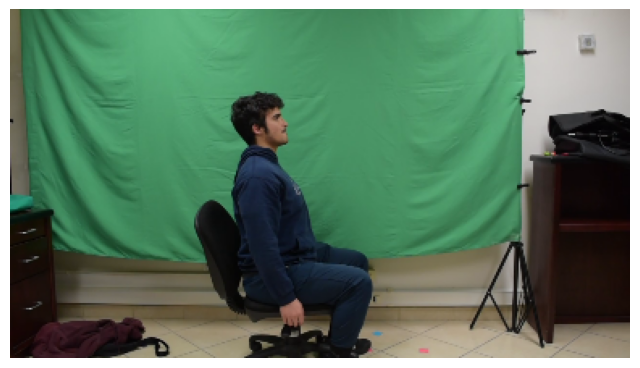

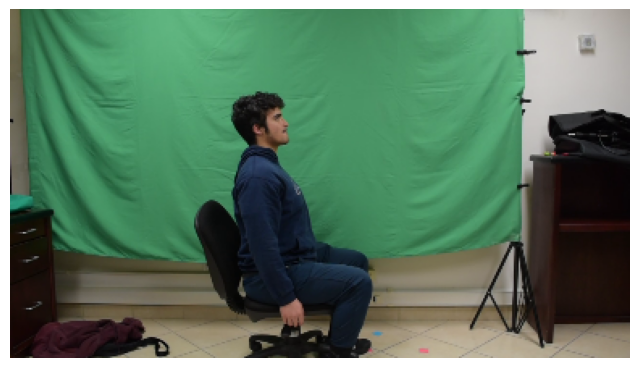

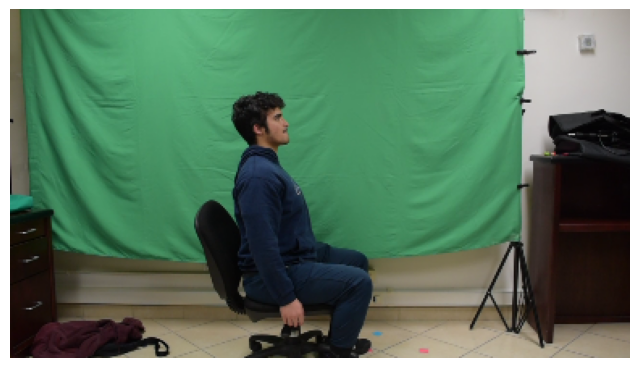

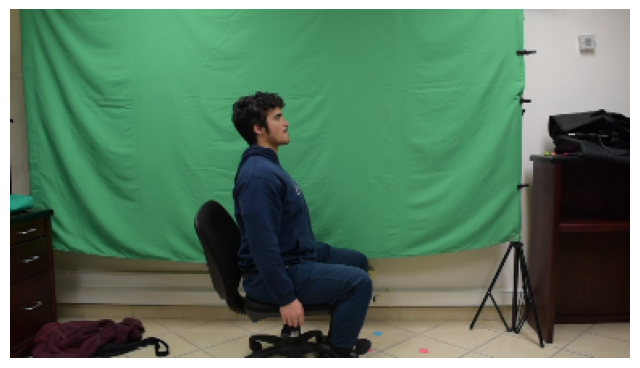

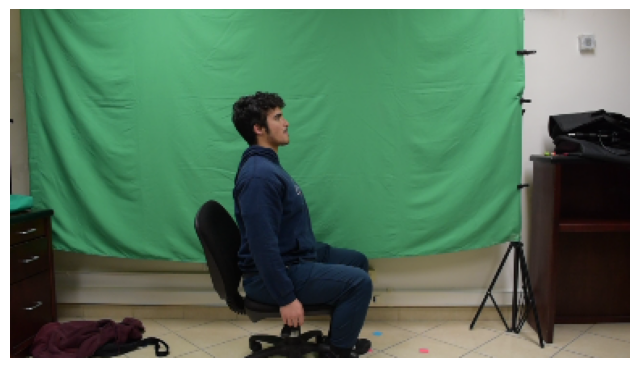

...

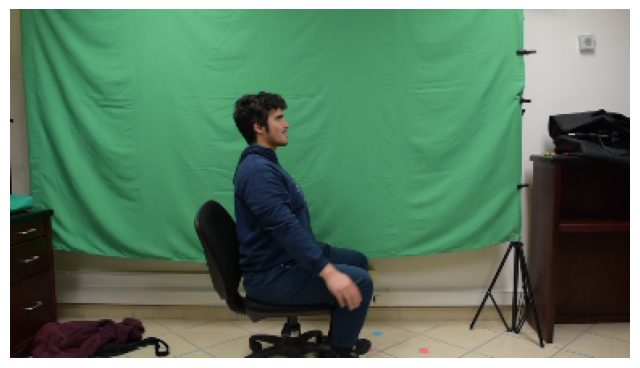

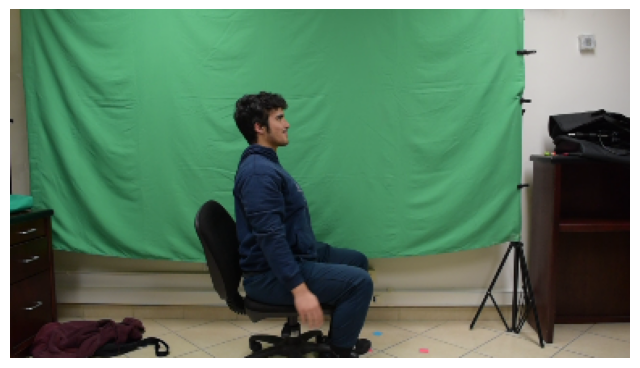

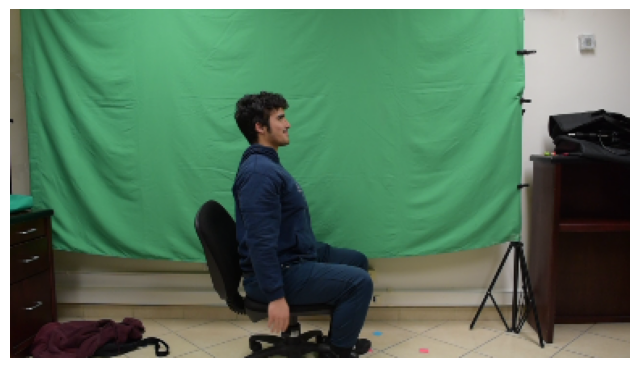

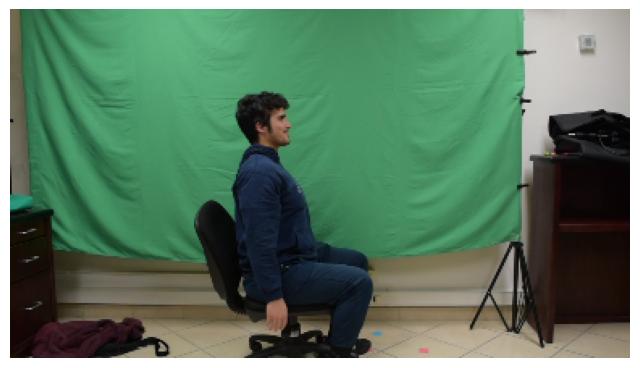

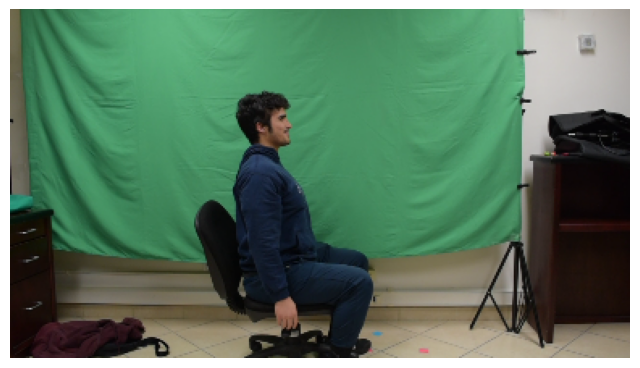

Total de fotogramas leídos: 366


In [15]:
video_ejemplo = ".//Videos/David/David_01-Complete.MOV"
cap = cv2.VideoCapture(video_ejemplo)

frame_count = 0
resize_factor = 0.3

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1
    if frame_count % 10 == 0:  # Mostrar cada 10 fotogramas
        frame_resized = cv2.resize(frame, (0, 0), fx=resize_factor, fy=resize_factor)
        frame_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)
        
        # Display using Matplotlib
        plt.figure(figsize=(8, 6))
        plt.imshow(frame_rgb)
        plt.axis('off')
        plt.show()

cap.release()
print(f"Total de fotogramas leídos: {frame_count}")

<h3>Extracción de caracteristicas</h3>

<p> Se plantea utilizar los landmarks especificados en el siguiente metodo </p>

In [16]:
def demo_data_collection(video_path):
    mp_pose = mp.solutions.pose
    pose = mp_pose.Pose(static_image_mode=False,min_detection_confidence=0.5,min_tracking_confidence=0.5)
    cap = cv2.VideoCapture(video_path)
    
    landmarks_list = []

    ret, frame = cap.read()
    if not ret:
        return
    # Convertir el frame a RGB
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = pose.process(image)

    # Dibujar los landmarks en el frame original
    if results.pose_landmarks:
        landmarks = results.pose_landmarks.landmark
        print("Landmarks del primer fotograma:")
        #Se especifican los landmarks que utilizara el modelo
        upper_body = {
            "left_shoulder": (landmarks[mp_pose.PoseLandmark.LEFT_SHOULDER.value].x,
                                landmarks[mp_pose.PoseLandmark.LEFT_SHOULDER.value].y),
            "right_shoulder": (landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value].x,
                                landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value].y),
            "left_elbow": (landmarks[mp_pose.PoseLandmark.LEFT_ELBOW.value].x,
                            landmarks[mp_pose.PoseLandmark.LEFT_ELBOW.value].y),
            "right_elbow": (landmarks[mp_pose.PoseLandmark.RIGHT_ELBOW.value].x,
                            landmarks[mp_pose.PoseLandmark.RIGHT_ELBOW.value].y),
            "left_wrist": (landmarks[mp_pose.PoseLandmark.LEFT_WRIST.value].x,
                            landmarks[mp_pose.PoseLandmark.LEFT_WRIST.value].y),
            "right_wrist": (landmarks[mp_pose.PoseLandmark.RIGHT_WRIST.value].x,
                            landmarks[mp_pose.PoseLandmark.RIGHT_WRIST.value].y),
            
        }
        formatted = format_landmarks(upper_body)
        print(formatted)
        # Extraer coordenadas de los landmarks
        landmarks_list.append(formatted)
    cap.release()
    cv2.destroyAllWindows()
    pose.close()
    return np.array(landmarks_list)
video_path = './Videos/David/David_01-Complete.MOV'
demo_data_collection(video_path)

Landmarks del primer fotograma:
[0.41173679 0.46189415 0.4016405  0.4553358  0.43665877 0.62711871
 0.40687886 0.648862   0.49525434 0.74845558 0.4539271  0.83333385]


array([[0.41173679, 0.46189415, 0.4016405 , 0.4553358 , 0.43665877,
        0.62711871, 0.40687886, 0.648862  , 0.49525434, 0.74845558,
        0.4539271 , 0.83333385]])

<p>Se utiliza una version del metodo anterior, pero considerando una mayor cantidad de frames de cada video de entrada. Los videos de entrada se cargan utilizando el metodo load_video_files, que recibe el path del folder donde se encuentran los videos</p>

In [50]:
videos = load_video_files('./Videos/')
data,labels = extract_landmarks(videos,256,10,True)
print(data)
print(labels)

[[0.00031191 0.00074176 0.00030408 ... 0.0009924  0.0003517  0.00120873]
 [0.00030895 0.00074208 0.00030196 ... 0.00098958 0.00032977 0.00121197]
 [0.00030777 0.00074199 0.00030148 ... 0.00098556 0.00033121 0.0012045 ]
 ...
 [0.00030288 0.00067996 0.0003151  ... 0.00096854 0.00046791 0.00069495]
 [0.00030163 0.00068    0.0003157  ... 0.00097556 0.00046803 0.00069522]
 [0.00030183 0.00068    0.00031577 ... 0.00097703 0.00046803 0.00069545]]
[[1 0 0]
 [1 0 0]
 [1 0 0]
 ...
 [0 0 1]
 [0 0 1]
 [0 0 1]]


In [35]:
def normalize_landmarks(data):
    left_shoulder = data[:, 0:2]  # Coordenadas x, y del hombro izquierdo
    right_shoulder = data[:, 2:4]
    # Calcular la distancia euclidiana entre los hombros para cada frame
    escala = np.linalg.norm(left_shoulder - right_shoulder, axis=1, keepdims=True)  # (N, 1)

    # Normalizar todos los puntos con respecto a esta escala
    normalized_data = data / escala

    return normalized_data

In [51]:
normalized_data = normalize_landmarks(data)
print(normalized_data)

[[ 38.94907815  92.62688818  37.97238494 ... 123.92470613  43.91767746
  150.93986359]
 [ 42.19510726 101.34946769  41.23970166 ... 135.15179522  45.03863239
  165.52478921]
 [ 43.17751517 104.09427627  42.29483837 ... 138.2658784   46.46635412
  168.98059722]
 ...
 [ 13.86752229  31.13205538  14.42685072 ...  44.34461046  21.42307299
   31.81838646]
 [ 13.16282644  29.67447513  13.77683889 ...  42.57262836  20.42420304
   30.33881603]
 [ 13.2513527   29.85400078  13.86310129 ...  42.89413929  20.54774579
   30.53231218]]


In [55]:
model = build_model(data,labels)

Precision del modelo: 89.73%


In [58]:
validate_model(model,"../../../../../Desktop/Videos/Irma_01.mp4")


Predicted Label: Complete
